# Regression Predict Student Solution

© Explore Data Science Academy

---
### Honour Code

I {**YOUR NAME, YOUR SURNAME**}, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [82]:
# Libraries for data loading, data manipulation and data visulisation
import numpy as np #used to evaluate arrays
import pandas as pd #used to create and utilise tabular data ie Pandas DataFrame
import matplotlib.pyplot as plt #used to visualize data
import seaborn as sns #used to visualize data
from matplotlib import rc

# Libraries for data preparation and model building
import sklearn

# Setting global constants to ensure notebook results are reproducible
#PARAMETER_CONSTANT = ###

<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

In [83]:
df = pd.read_csv('df_train.csv', index_col=0) # load the data
pd.set_option('display.max_columns', None)

In [84]:
#Basic Analysis

df.shape #DataFrame has 8763 rows and 48 columns

(8763, 48)

In [85]:
df.head(50)

,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,Barcelona_wind_deg,Madrid_clouds_all,Seville_wind_speed,Barcelona_rain_1h,Seville_pressure,Seville_rain_1h,Bilbao_snow_3h,Barcelona_pressure,Seville_rain_3h,Madrid_rain_1h,Barcelona_rain_3h,Valencia_snow_3h,Madrid_weather_id,Barcelona_weather_id,Bilbao_pressure,Seville_weather_id,Valencia_pressure,Seville_temp_max,Madrid_pressure,Valencia_temp_max,Valencia_temp,Bilbao_weather_id,Seville_temp,Valencia_humidity,Valencia_temp_min,Barcelona_temp_max,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.000000,1.000000,0.000000,223.333333,6.333333,42.666667,0.000000,3.333333,0.0,sp25,0.0,0.0,1036.333333,0.0,0.0,0.0,0.0,800.000000,800.000000,1035.000000,800.000000,1002.666667,274.254667,971.333333,269.888000,269.888000,800.000000,274.254667,75.666667,269.888000,281.013000,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.000000,1.000000,0.000000,221.000000,4.000000,139.000000,0.000000,3.333333,0.0,sp25,0.0,0.0,1037.333333,0.0,0.0,0.0,0.0,800.000000,800.000000,1035.666667,800.000000,1004.333333,274.945000,972.666667,271.728333,271.728333,800.000000,274.945000,71.000000,271.728333,280.561667,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667
2,2015-01-01 09:00:00,1.000000,level_9,0.0,1.000000,71.333333,64.333333,0.000000,1.000000,0.000000,214.333333,2.000000,326.000000,0.000000,2.666667,0.0,sp25,0.0,0.0,1038.000000,0.0,0.0,0.0,0.0,800.000000,800.000000,1036.000000,800.000000,1005.333333,278.792000,974.000000,278.008667,278.008667,800.000000,278.792000,65.666667,278.008667,281.583667,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667
3,2015-01-01 12:00:00,1.000000,level_8,0.0,1.000000,65.333333,56.333333,0.000000,1.000000,0.000000,199.666667,2.333333,273.000000,0.000000,4.000000,0.0,sp25,0.0,0.0,1037.000000,0.0,0.0,0.0,0.0,800.000000,800.000000,1036.000000,800.000000,1009.000000,285.394000,994.666667,284.899552,284.899552,800.000000,285.394000,54.000000,284.899552,283.434104,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667
4,2015-01-01 15:00:00,1.000000,level_7,0.0,1.000000,59.000000,57.000000,2.000000,0.333333,0.000000,185.000000,4.333333,260.000000,0.000000,3.000000,0.0,sp25,0.0,0.0,1035.000000,0.0,0.0,0.0,0.0,800.000000,800.000000,1035.333333,800.000000,NaN,285.513719,1035.333333,283.015115,283.015115,800.000000,285.513719,58.333333,283.015115,284.213167,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667
5,2015-01-01 18:00:00,1.000000,level_7,0.0,1.000000,69.666667,67.333333,12.333333,0.666667,0.000000,191.333333,4.666667,254.666667,0.000000,2.666667,0.0,sp25,0.0,0.0,1035.666667,0.0,0.0,0.0,0.0,800.000000,800.000000,1035.666667,800.000000,NaN,282.077844,1013.333333,277.622563,277.622563,800.666667,282.077844,72.666667,277.622563,284.165625,274.639229,284.165625,277.919000,277.919000,284.165625,277.919000,282.077844,274.639229,274.639229,6842.000000
6,2015-01-01 21:00:00,1.000000,level_8,0.0,1.000000,83.666667,63.333333,16.333333,1.000000,0.000000,210.333333,3.333333,276.000000,0.000000,2.000000,0.0,sp25,0.0,0.0,1038.000000,0.0,0.0,0.0,0.0,800.000000,800.000000,1036.000000,800.000000,1006.000000,277.637000,974.333333,272.270333,272.270333,800.666667,277.637000,83.333333,272.270333,283.420333,268.287000,283.420333,274.295437,274.295437,283.420333,274.295437,277.637000,268.287000,268.287000,10

In [86]:
print(df['Seville_pressure'].unique())
print(df['Valencia_wind_deg'].unique())

['sp25' 'sp23' 'sp24' 'sp21' 'sp16' 'sp9' 'sp15' 'sp19' 'sp22' 'sp11'
 'sp8' 'sp4' 'sp6' 'sp13' 'sp17' 'sp20' 'sp18' 'sp14' 'sp12' 'sp5' 'sp10'
 'sp7' 'sp3' 'sp2' 'sp1']
['level_5' 'level_10' 'level_9' 'level_8' 'level_7' 'level_6' 'level_4'
 'level_3' 'level_1' 'level_2']


In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8763 entries, 0 to 8762
Data columns (total 48 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   time                  8763 non-null   object 
 1   Madrid_wind_speed     8763 non-null   float64
 2   Valencia_wind_deg     8763 non-null   object 
 3   Bilbao_rain_1h        8763 non-null   float64
 4   Valencia_wind_speed   8763 non-null   float64
 5   Seville_humidity      8763 non-null   float64
 6   Madrid_humidity       8763 non-null   float64
 7   Bilbao_clouds_all     8763 non-null   float64
 8   Bilbao_wind_speed     8763 non-null   float64
 9   Seville_clouds_all    8763 non-null   float64
 10  Bilbao_wind_deg       8763 non-null   float64
 11  Barcelona_wind_speed  8763 non-null   float64
 12  Barcelona_wind_deg    8763 non-null   float64
 13  Madrid_clouds_all     8763 non-null   float64
 14  Seville_wind_speed    8763 non-null   float64
 15  Barcelona_rain_1h    

In [88]:
df['time']=pd.to_datetime(df['time'])

In [89]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8763 entries, 0 to 8762
Data columns (total 48 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   time                  8763 non-null   datetime64[ns]
 1   Madrid_wind_speed     8763 non-null   float64       
 2   Valencia_wind_deg     8763 non-null   object        
 3   Bilbao_rain_1h        8763 non-null   float64       
 4   Valencia_wind_speed   8763 non-null   float64       
 5   Seville_humidity      8763 non-null   float64       
 6   Madrid_humidity       8763 non-null   float64       
 7   Bilbao_clouds_all     8763 non-null   float64       
 8   Bilbao_wind_speed     8763 non-null   float64       
 9   Seville_clouds_all    8763 non-null   float64       
 10  Bilbao_wind_deg       8763 non-null   float64       
 11  Barcelona_wind_speed  8763 non-null   float64       
 12  Barcelona_wind_deg    8763 non-null   float64       
 13  Madrid_clouds_all 

In [90]:
df.dtypes

time                    datetime64[ns]
Madrid_wind_speed              float64
Valencia_wind_deg               object
Bilbao_rain_1h                 float64
Valencia_wind_speed            float64
Seville_humidity               float64
Madrid_humidity                float64
Bilbao_clouds_all              float64
Bilbao_wind_speed              float64
Seville_clouds_all             float64
Bilbao_wind_deg                float64
Barcelona_wind_speed           float64
Barcelona_wind_deg             float64
Madrid_clouds_all              float64
Seville_wind_speed             float64
Barcelona_rain_1h              float64
Seville_pressure                object
Seville_rain_1h                float64
Bilbao_snow_3h                 float64
Barcelona_pressure             float64
Seville_rain_3h                float64
Madrid_rain_1h                 float64
Barcelona_rain_3h              float64
Valencia_snow_3h               float64
Madrid_weather_id              float64
Barcelona_weather_id     

In [91]:
#Extract day, month, year, hour
df['Day'] = df['time'].dt.day

In [92]:
df['Month'] = df['time'].dt.month

In [93]:
df['Year'] = df['time'].dt.year

In [94]:
df["Hour"]=df['time'].dt.hour

In [95]:
df.drop('time',axis=1,inplace=True)

In [96]:
df.head(2)

,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,Barcelona_wind_deg,Madrid_clouds_all,Seville_wind_speed,Barcelona_rain_1h,Seville_pressure,Seville_rain_1h,Bilbao_snow_3h,Barcelona_pressure,Seville_rain_3h,Madrid_rain_1h,Barcelona_rain_3h,Valencia_snow_3h,Madrid_weather_id,Barcelona_weather_id,Bilbao_pressure,Seville_weather_id,Valencia_pressure,Seville_temp_max,Madrid_pressure,Valencia_temp_max,Valencia_temp,Bilbao_weather_id,Seville_temp,Valencia_humidity,Valencia_temp_min,Barcelona_temp_max,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h,Day,Month,Year,Hour
0,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.0,0.0,223.333333,6.333333,42.666667,0.0,3.333333,0.0,sp25,0.0,0.0,1036.333333,0.0,0.0,0.0,0.0,800.0,800.0,1035.000000,800.0,1002.666667,274.254667,971.333333,269.888000,269.888000,800.0,274.254667,75.666667,269.888000,281.013000,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667,1,1,2015,3
1,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.0,0.0,221.000000,4.000000,139.000000,0.0,3.333333,0.0,sp25,0.0,0.0,1037.333333,0.0,0.0,0.0,0.0,800.0,800.0,1035.666667,800.0,1004.333333,274.945000,972.666667,271.728333,271.728333,800.0,274.945000,71.000000,271.728333,280.561667,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667,1,1,2015,6


In [97]:
#Extract the number from Seville_pressure (turn object into numeric datatime)
df['Seville_pressure'] = df['Seville_pressure'].str[2:]
df['Seville_pressure'] = round(df['Seville_pressure'].astype(float), 6)

In [98]:
df['Valencia_wind_deg'] = df['Valencia_wind_deg'].str[6:]
df['Valencia_wind_deg'] = round(df['Valencia_wind_deg'].astype(float), 6)

In [99]:
df.head()

,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,Barcelona_wind_deg,Madrid_clouds_all,Seville_wind_speed,Barcelona_rain_1h,Seville_pressure,Seville_rain_1h,Bilbao_snow_3h,Barcelona_pressure,Seville_rain_3h,Madrid_rain_1h,Barcelona_rain_3h,Valencia_snow_3h,Madrid_weather_id,Barcelona_weather_id,Bilbao_pressure,Seville_weather_id,Valencia_pressure,Seville_temp_max,Madrid_pressure,Valencia_temp_max,Valencia_temp,Bilbao_weather_id,Seville_temp,Valencia_humidity,Valencia_temp_min,Barcelona_temp_max,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h,Day,Month,Year,Hour
0,0.666667,5.0,0.0,0.666667,74.333333,64.000000,0.0,1.000000,0.0,223.333333,6.333333,42.666667,0.0,3.333333,0.0,25.0,0.0,0.0,1036.333333,0.0,0.0,0.0,0.0,800.0,800.0,1035.000000,800.0,1002.666667,274.254667,971.333333,269.888000,269.888000,800.0,274.254667,75.666667,269.888000,281.013000,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667,1,1,2015,3
1,0.333333,10.0,0.0,1.666667,78.333333,64.666667,0.0,1.000000,0.0,221.000000,4.000000,139.000000,0.0,3.333333,0.0,25.0,0.0,0.0,1037.333333,0.0,0.0,0.0,0.0,800.0,800.0,1035.666667,800.0,1004.333333,274.945000,972.666667,271.728333,271.728333,800.0,274.945000,71.000000,271.728333,280.561667,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667,1,1,2015,6
2,1.000000,9.0,0.0,1.000000,71.333333,64.333333,0.0,1.000000,0.0,214.333333,2.000000,326.000000,0.0,2.666667,0.0,25.0,0.0,0.0,1038.000000,0.0,0.0,0.0,0.0,800.0,800.0,1036.000000,800.0,1005.333333,278.792000,974.000000,278.008667,278.008667,800.0,278.792000,65.666667,278.008667,281.583667,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667,1,1,2015,9
3,1.000000,8.0,0.0,1.000000,65.333333,56.333333,0.0,1.000000,0.0,199.666667,2.333333,273.000000,0.0,4.000000,0.0,25.0,0.0,0.0,1037.000000,0.0,0.0,0.0,0.0,800.0,800.0,1036.000000,800.0,1009.000000,285.394000,994.666667,284.899552,284.899552,800.0,285.394000,54.000000,284.899552,283.434104,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667,1,1,2015,12
4,1.000000,7.0,0.0,1.000000,59.000000,57.000000,2.0,0.333333,0.0,185.000000,4.333333,260.000000,0.0,3.000000,0.0,25.0,0.0,0.0,1035.000000,0.0,0.0,0.0,0.0,800.0,800.0,1035.333333,800.0,NaN,285.513719,1035.333333,283.015115,283.015115,800.0,285.513719,58.333333,283.015115,284.213167,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667,1,1,2015,15


In [100]:
df.dtypes

Madrid_wind_speed       float64
Valencia_wind_deg       float64
Bilbao_rain_1h          float64
Valencia_wind_speed     float64
Seville_humidity        float64
Madrid_humidity         float64
Bilbao_clouds_all       float64
Bilbao_wind_speed       float64
Seville_clouds_all      float64
Bilbao_wind_deg         float64
Barcelona_wind_speed    float64
Barcelona_wind_deg      float64
Madrid_clouds_all       float64
Seville_wind_speed      float64
Barcelona_rain_1h       float64
Seville_pressure        float64
Seville_rain_1h         float64
Bilbao_snow_3h          float64
Barcelona_pressure      float64
Seville_rain_3h         float64
Madrid_rain_1h          float64
Barcelona_rain_3h       float64
Valencia_snow_3h        float64
Madrid_weather_id       float64
Barcelona_weather_id    float64
Bilbao_pressure         float64
Seville_weather_id      float64
Valencia_pressure       float64
Seville_temp_max        float64
Madrid_pressure         float64
Valencia_temp_max       float64
Valencia

In [101]:
df.isnull().sum()

Madrid_wind_speed          0
Valencia_wind_deg          0
Bilbao_rain_1h             0
Valencia_wind_speed        0
Seville_humidity           0
Madrid_humidity            0
Bilbao_clouds_all          0
Bilbao_wind_speed          0
Seville_clouds_all         0
Bilbao_wind_deg            0
Barcelona_wind_speed       0
Barcelona_wind_deg         0
Madrid_clouds_all          0
Seville_wind_speed         0
Barcelona_rain_1h          0
Seville_pressure           0
Seville_rain_1h            0
Bilbao_snow_3h             0
Barcelona_pressure         0
Seville_rain_3h            0
Madrid_rain_1h             0
Barcelona_rain_3h          0
Valencia_snow_3h           0
Madrid_weather_id          0
Barcelona_weather_id       0
Bilbao_pressure            0
Seville_weather_id         0
Valencia_pressure       2068
Seville_temp_max           0
Madrid_pressure            0
Valencia_temp_max          0
Valencia_temp              0
Bilbao_weather_id          0
Seville_temp               0
Valencia_humid

In [102]:
df = df.sort_index(axis=1)
df.head()

,Barcelona_pressure,Barcelona_rain_1h,Barcelona_rain_3h,Barcelona_temp,Barcelona_temp_max,Barcelona_temp_min,Barcelona_weather_id,Barcelona_wind_deg,Barcelona_wind_speed,Bilbao_clouds_all,Bilbao_pressure,Bilbao_rain_1h,Bilbao_snow_3h,Bilbao_temp,Bilbao_temp_max,Bilbao_temp_min,Bilbao_weather_id,Bilbao_wind_deg,Bilbao_wind_speed,Day,Hour,Madrid_clouds_all,Madrid_humidity,Madrid_pressure,Madrid_rain_1h,Madrid_temp,Madrid_temp_max,Madrid_temp_min,Madrid_weather_id,Madrid_wind_speed,Month,Seville_clouds_all,Seville_humidity,Seville_pressure,Seville_rain_1h,Seville_rain_3h,Seville_temp,Seville_temp_max,Seville_temp_min,Seville_weather_id,Seville_wind_speed,Valencia_humidity,Valencia_pressure,Valencia_snow_3h,Valencia_temp,Valencia_temp_max,Valencia_temp_min,Valencia_wind_deg,Valencia_wind_speed,Year,load_shortfall_3h
0,1036.333333,0.0,0.0,281.013000,281.013000,281.013000,800.0,42.666667,6.333333,0.0,1035.000000,0.0,0.0,269.338615,269.338615,269.338615,800.0,223.333333,1.000000,1,3,0.0,64.000000,971.333333,0.0,265.938000,265.938000,265.938000,800.0,0.666667,1,0.0,74.333333,25.0,0.0,0.0,274.254667,274.254667,274.254667,800.0,3.333333,75.666667,1002.666667,0.0,269.888000,269.888000,269.888000,5.0,0.666667,2015,6715.666667
1,1037.333333,0.0,0.0,280.561667,280.561667,280.561667,800.0,139.000000,4.000000,0.0,1035.666667,0.0,0.0,270.376000,270.376000,270.376000,800.0,221.000000,1.000000,1,6,0.0,64.666667,972.666667,0.0,266.386667,266.386667,266.386667,800.0,0.333333,1,0.0,78.333333,25.0,0.0,0.0,274.945000,274.945000,274.945000,800.0,3.333333,71.000000,1004.333333,0.0,271.728333,271.728333,271.728333,10.0,1.666667,2015,4171.666667
2,1038.000000,0.0,0.0,281.583667,281.583667,281.583667,800.0,326.000000,2.000000,0.0,1036.000000,0.0,0.0,275.027229,275.027229,275.027229,800.0,214.333333,1.000000,1,9,0.0,64.333333,974.000000,0.0,272.708667,272.708667,272.708667,800.0,1.000000,1,0.0,71.333333,25.0,0.0,0.0,278.792000,278.792000,278.792000,800.0,2.666667,65.666667,1005.333333,0.0,278.008667,278.008667,278.008667,9.0,1.000000,2015,4274.666667
3,1037.000000,0.0,0.0,283.434104,283.434104,283.434104,800.0,273.000000,2.333333,0.0,1036.000000,0.0,0.0,281.135063,281.135063,281.135063,800.0,199.666667,1.000000,1,12,0.0,56.333333,994.666667,0.0,281.895219,281.895219,281.895219,800.0,1.000000,1,0.0,65.333333,25.0,0.0,0.0,285.394000,285.394000,285.394000,800.0,4.000000,54.000000,1009.000000,0.0,284.899552,284.899552,284.899552,8.0,1.000000,2015,5075.666667
4,1035.000000,0.0,0.0,284.213167,284.213167,284.213167,800.0,260.000000,4.333333,2.0,1035.333333,0.0,0.0,282.252063,282.252063,282.252063,800.0,185.000000,0.333333,1,15,0.0,57.000000,1035.333333,0.0,280.678437,280.678437,280.678437,800.0,1.000000,1,0.0,59.000000,25.0,0.0,0.0,285.513719,285.513719,285.513719,800.0,3.000000,58.333333,NaN,0.0,283.015115,283.015115,283.015115,7.0,1.000000,2015,6620.666667


In [103]:
df.shape

(8763, 51)

<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


In [104]:
# look at data statistics

df.describe()
###These are the descriptive statistics of each feature. 
###Notice how, from above, df['Valencia_pressure'] has 2068 null values out of 8763

,Barcelona_pressure,Barcelona_rain_1h,Barcelona_rain_3h,Barcelona_temp,Barcelona_temp_max,Barcelona_temp_min,Barcelona_weather_id,Barcelona_wind_deg,Barcelona_wind_speed,Bilbao_clouds_all,Bilbao_pressure,Bilbao_rain_1h,Bilbao_snow_3h,Bilbao_temp,Bilbao_temp_max,Bilbao_temp_min,Bilbao_weather_id,Bilbao_wind_deg,Bilbao_wind_speed,Day,Hour,Madrid_clouds_all,Madrid_humidity,Madrid_pressure,Madrid_rain_1h,Madrid_temp,Madrid_temp_max,Madrid_temp_min,Madrid_weather_id,Madrid_wind_speed,Month,Seville_clouds_all,Seville_humidity,Seville_pressure,Seville_rain_1h,Seville_rain_3h,Seville_temp,Seville_temp_max,Seville_temp_min,Seville_weather_id,Seville_wind_speed,Valencia_humidity,Valencia_pressure,Valencia_snow_3h,Valencia_temp,Valencia_temp_max,Valencia_temp_min,Valencia_wind_deg,Valencia_wind_speed,Year,load_shortfall_3h
count,8.763000e+03,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,6695.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000
mean,1.377965e+03,0.128906,0.000439,289.855459,291.157644,288.447422,765.979687,190.544848,2.870497,43.469132,1017.739549,0.135753,0.031912,286.422929,287.966027,285.017973,724.722362,158.957511,1.850356,15.740157,10.498459,19.473392,57.414717,1010.316920,0.037818,288.419439,289.540309,287.202203,773.527594,2.425729,6.524820,13.714748,62.658793,13.507246,0.039439,0.000243,293.978903,297.479527,291.633356,774.658818,2.425045,65.247727,1012.051407,0.000205,290.592152,291.337233,289.867648,5.276389,2.586272,2016.000571,10673.857612
std,1.407314e+04,0.634730,0.003994,6.528111,7.273538,6.102593,88.142235,89.077337,1.792197,32.551044,10.046124,0.374901,0.557264,6.818682,7.105590,6.705672,115.846537,102.056299,1.695888,8.798664,6.874031,28.053660,24.335396,22.198555,0.152639,9.346796,9.752047,9.206237,77.313315,1.850371,3.447976,24.272482,22.621226,7.237267,0.175857,0.003660,7.920986,8.875812,8.178220,71.940009,1.672895,19.262322,9.506214,0.011866,7.162274,7.565692,6.907402,2.877642,2.411190,0.816054,5218.046404
min,6.706667e+02,0.000000,0.000000,270.816667,272.150000,269.483333,200.666667,0.000000,0.000000,0.000000,971.333333,0.000000,0.000000,267.483333,269.063000,264.483333,207.333333,0.000000,0.000000,1.000000,0.000000,0.000000,6.333333,927.666667,0.000000,264.983333,264.983333,264.983333,211.000000,0.000000,1.000000,0.000000,8.333333,1.000000,0.000000,0.000000,272.063000,272.063000,270.150000,200.000000,0.000000,10.333333,972.666667,0.000000,269.888000,269.888000,269.888000,1.000000,0.000000,2015.000000,-6618.000000
25%,1.014000e+03,0.000000,0.000000,284.973443,285.483333,284.150000,800.000000,118.166667,1.666667,10.000000,1013.000000,0.000000,0.000000,281.374167,282.836776,280.085167,700.333333,73.333333,0.666667,8.000000,4.500000,0.000000,36.333333,1012.333333,0.000000,281.404281,282.150000,280.299167,800.000000,1.000000,4.000000,0.000000,44.333333,7.000000,0.000000,0.000000,288.282917,291.312750,285.816667,800.000000,1.000000,51.333333,1010.333333,0.000000,285.150000,285.550167,284.783333,3.000000,1.000000,2015.000000,7390.333333
50%,1.018000e+03,0.000000,0.000000,289.416667,290.150000,288.150000,800.333333,200.000000,2.666667,45.000000,1019.000000,0.000000,0.000000,286.158333,287.630000,284.816667,800.000000,147.000000,1.000000,16.000000,9.000000,0.000000,58.000000,1017.333333,0.000000,287.053333,288.116177,286.083333,800.000000,2.000000,7.000000,0.000000,65.666667,14.000000,0.000000,0.000000,293.323333,297.101667,290.816667,800.000000,2.000000,67.000000,1015.000000,0.000000,290.176667,291.037000,289.550000,5.

In [105]:
#are Barcelona_rain_1h, Barcelona_rain_3h, Bilbao_rain_1h, Bilbao_snow_3h, Madrid_clouds_all, Madrid_rain_1h, 
#Seville_rain_1h, Seville_rain_3h, Valencia_snow_3h categorical data? Why are the min, 25%, 50% and 75% zero?

print(df['Barcelona_rain_1h'].unique())
print(df['Bilbao_rain_1h'].unique())

[ 0.   0.1  0.2  0.3  0.9  0.7  2.1  1.   4.   8.  12.   6.   2.3  0.6
  0.5  0.4  1.3  1.6  2.   3.   1.2  4.1  1.1  5.3  8.3  1.4  4.4  9.
  4.3  4.2  5. ]
[0.   0.2  0.3  0.1  0.7  0.9  0.5  2.3  3.   1.2  0.6  1.6  0.15 2.1
 0.4  1.1  1.4  1.   2.   1.3 ]


In [106]:
skew = df.skew() #skew statistics indicate how symmetrical the data is
df_skew = skew.to_frame('Skew')
skew_list = np.array(df_skew['Skew'])

In [107]:
def skew_interpretation(slist):
    interpretation = []
    for x in slist:
        if -0.5<x and x<0.5:
            interpretation.append("Fairly Symmetrical")
        elif -1<x and x<-0.5:
            interpretation.append("Moderately Negative")
        elif -1>x:
            interpretation.append("Highly Negative")
        elif 0.5<x and x<=1:
            interpretation.append("Moderately Positive")
        else:
            interpretation.append("Highly Positive")
    return np.array(interpretation)

df_skew['Interpretation'] = skew_interpretation(skew_list)
df_skew

,Skew,Interpretation
Barcelona_pressure,57.979664,Highly Positive
Barcelona_rain_1h,8.726988,Highly Positive
Barcelona_rain_3h,12.696605,Highly Positive
Barcelona_temp,0.128095,Fairly Symmetrical
Barcelona_temp_max,0.276925,Fairly Symmetrical
Barcelona_temp_min,-0.018057,Fairly Symmetrical
Barcelona_weather_id,-2.584011,Highly Negative
Barcelona_wind_deg,-0.180001,Fairly Symmetrical
Barcelona_wind_speed,1.057331,Highly Positive
Bilbao_clouds_all,-0.053085,Fairly Symmetrical


In [108]:
kurtosis = df.kurtosis() #kurtosis statistics indicate columns have a large number of outliers or lack outliers
df_kurtosis = kurtosis.to_frame('Kurtosis')
kurtosis_list = np.array(df_kurtosis['Kurtosis'])

In [109]:
def kurtosis_interpretation(klist):
    interpretation = []
    for x in klist:
        if 3<=x:
            interpretation.append("Large Number of Outliers")
        else:
            interpretation.append("Lack of Outliers")
    return np.array(interpretation)

df_kurtosis['Interpretation'] = kurtosis_interpretation(kurtosis_list)
df_kurtosis

,Kurtosis,Interpretation
Barcelona_pressure,3687.564230,Large Number of Outliers
Barcelona_rain_1h,101.578931,Large Number of Outliers
Barcelona_rain_3h,187.800460,Large Number of Outliers
Barcelona_temp,-0.696555,Lack of Outliers
Barcelona_temp_max,-0.728757,Lack of Outliers
Barcelona_temp_min,-0.474890,Lack of Outliers
Barcelona_weather_id,5.701882,Large Number of Outliers
Barcelona_wind_deg,-0.959160,Lack of Outliers
Barcelona_wind_speed,1.493635,Lack of Outliers
Bilbao_clouds_all,-1.533417,Lack of Outliers


In [110]:
df.shape

(8763, 51)

In [111]:
# check for linearity

fig, axs = plt.subplots(13, 4, figsize=(100,150),)
fig.subplots_adjust(hspace=2, wspace=0.2)
axs = axs.ravel()

for index, column in enumerate(df.columns):
    axs[index-1].set_title("{} vs. load_shortfall_3h".format(column), fontsize=16)
    axs[index-1].scatter(x=df[column], y=df['load_shortfall_3h'], color='blue', edgecolor='k')
    
fig.tight_layout(pad=1)

In [112]:
def plot(df, col):
    fig, (ax1,ax2) = plt.subplots(2,1)
    sns.histplot(df[col], ax=ax1)
    sns.boxplot(df[col], ax=ax2)

C:\Users\rebec\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<Figure size 2160x1440 with 0 Axes>

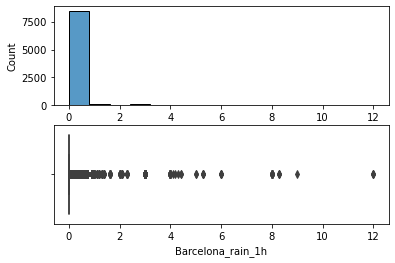

In [113]:
plt.figure(figsize = (30,20))
plot(df, 'Barcelona_rain_1h')

In [114]:
#Impute Valencia_pressure with the median and not mean because the data is highly negatively skewed
val_pressure = df.Valencia_pressure.median()
df.loc[df.Valencia_pressure.isnull(),'Valencia_pressure'] = val_pressure

In [115]:
df.isnull().sum()

Barcelona_pressure      0
Barcelona_rain_1h       0
Barcelona_rain_3h       0
Barcelona_temp          0
Barcelona_temp_max      0
Barcelona_temp_min      0
Barcelona_weather_id    0
Barcelona_wind_deg      0
Barcelona_wind_speed    0
Bilbao_clouds_all       0
Bilbao_pressure         0
Bilbao_rain_1h          0
Bilbao_snow_3h          0
Bilbao_temp             0
Bilbao_temp_max         0
Bilbao_temp_min         0
Bilbao_weather_id       0
Bilbao_wind_deg         0
Bilbao_wind_speed       0
Day                     0
Hour                    0
Madrid_clouds_all       0
Madrid_humidity         0
Madrid_pressure         0
Madrid_rain_1h          0
Madrid_temp             0
Madrid_temp_max         0
Madrid_temp_min         0
Madrid_weather_id       0
Madrid_wind_speed       0
Month                   0
Seville_clouds_all      0
Seville_humidity        0
Seville_pressure        0
Seville_rain_1h         0
Seville_rain_3h         0
Seville_temp            0
Seville_temp_max        0
Seville_temp

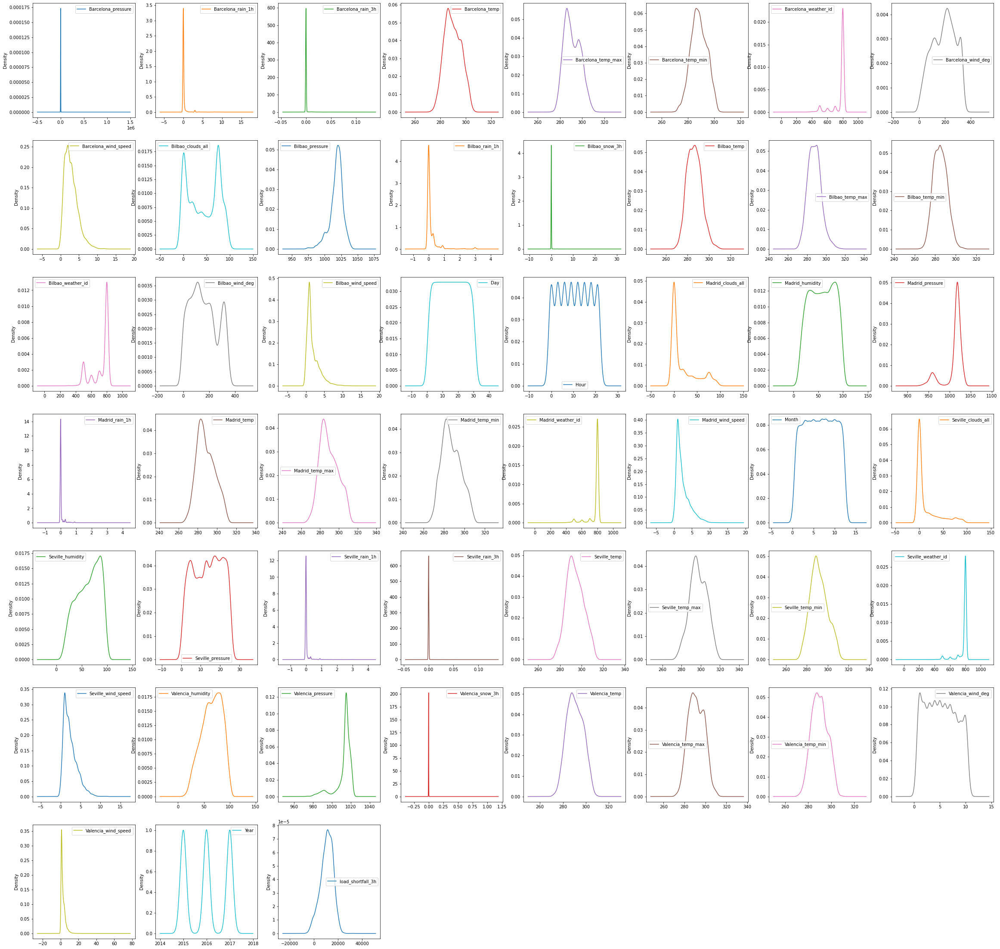

In [116]:
# Distributions & Extreme Values
features = df.columns
df[features].plot(kind='density', subplots=True, layout=(7, 8), sharex=False, figsize=(40, 40));

<function matplotlib.pyplot.show(close=None, block=None)>

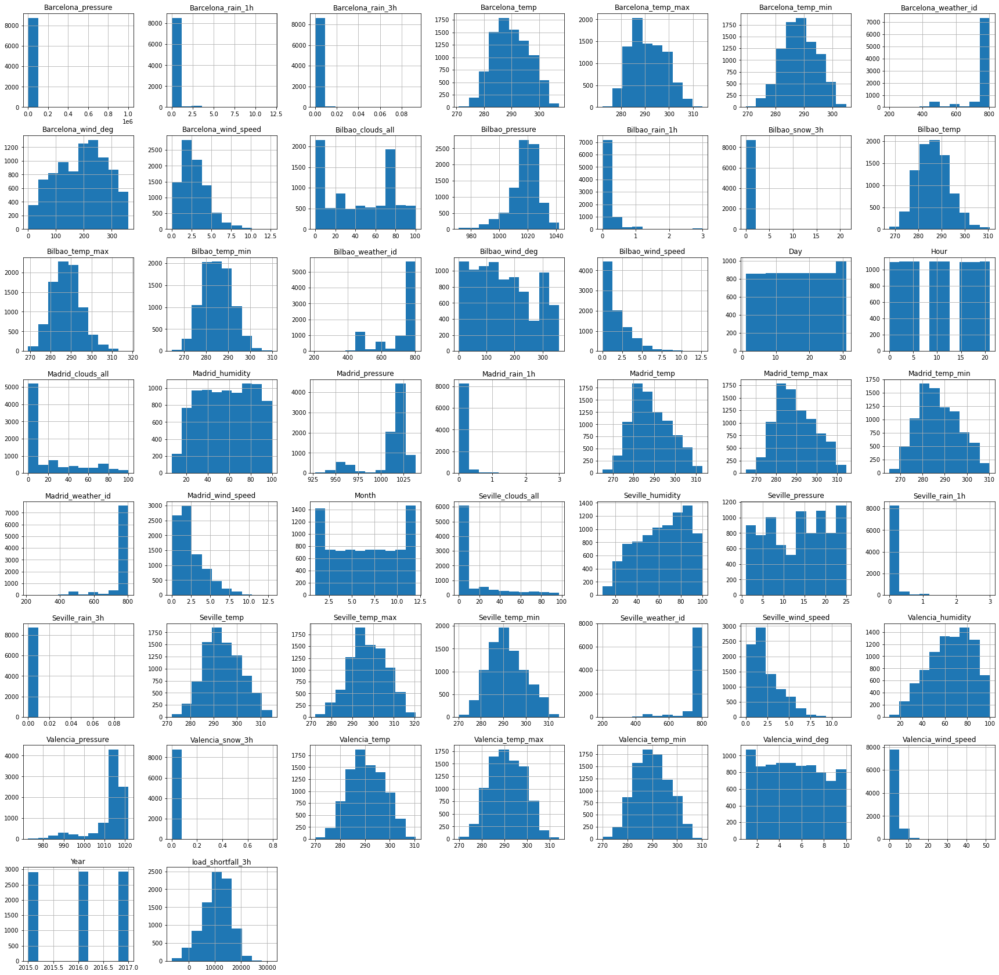

In [117]:
df.hist(bins=10, figsize=(30,30)) 
plt.show

In [118]:
#Reorder the columns
column_titles = [col for col in df.columns if col!= 'load_shortfall_3h'] + ['load_shortfall_3h']
df = df.reindex(columns=column_titles)

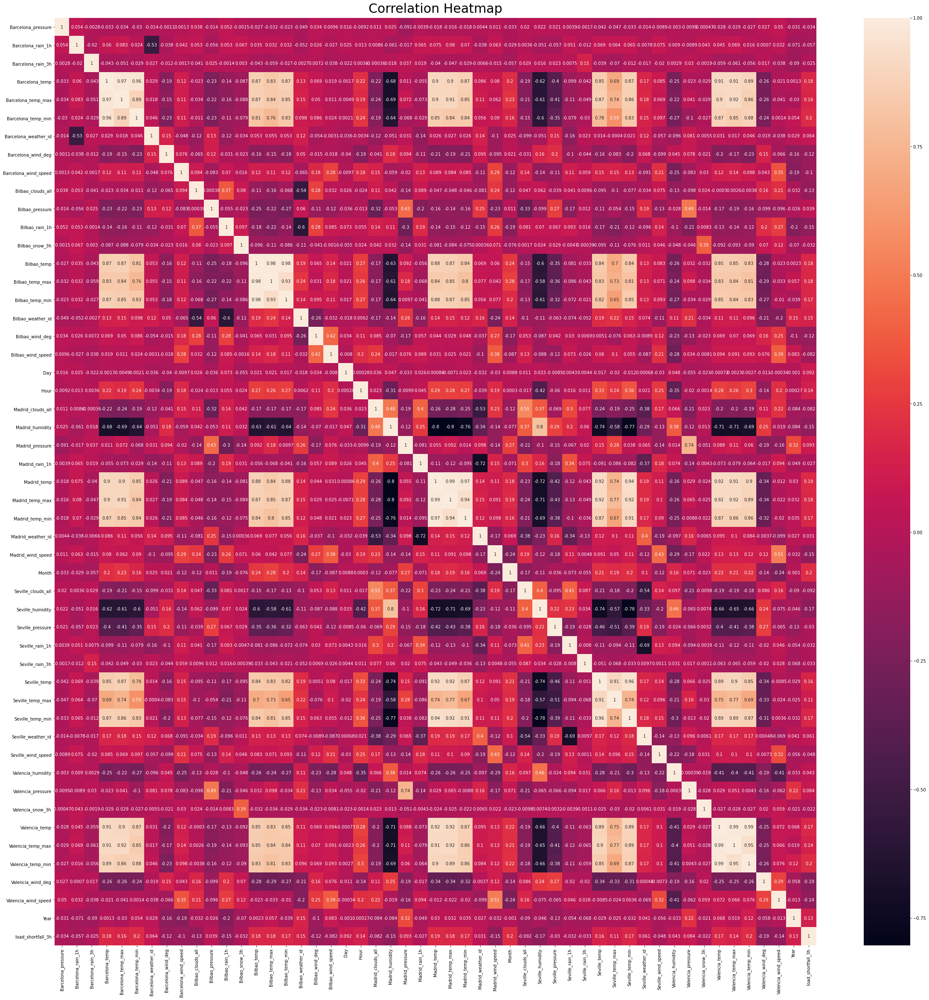

In [119]:
# evaluate correlation
plt.figure(figsize = (40,40))
heatmap = sns.heatmap(df.corr(), annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':30}, pad=12);

In [120]:
print(df['Valencia_wind_deg'].unique())

[ 5. 10.  9.  8.  7.  6.  4.  3.  1.  2.]


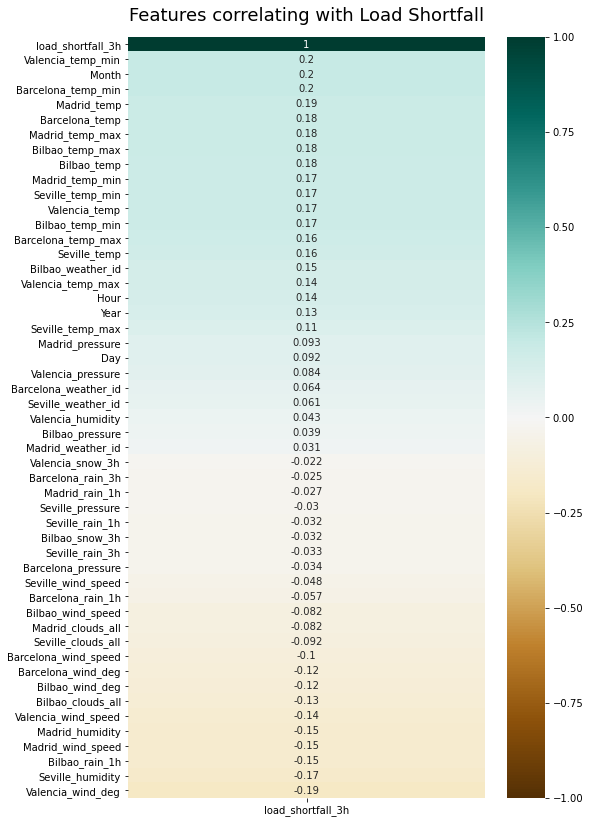

In [121]:
plt.figure(figsize=(8,14))
hm = sns.heatmap(df.corr()[['load_shortfall_3h']].sort_values(by='load_shortfall_3h', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
hm.set_title('Features correlating with Load Shortfall', fontdict={'fontsize':18}, pad=16);

In [122]:
# have a look at feature distributions

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section you are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

In [123]:
# remove missing values/ features
df.isnull().sum()

Barcelona_pressure      0
Barcelona_rain_1h       0
Barcelona_rain_3h       0
Barcelona_temp          0
Barcelona_temp_max      0
Barcelona_temp_min      0
Barcelona_weather_id    0
Barcelona_wind_deg      0
Barcelona_wind_speed    0
Bilbao_clouds_all       0
Bilbao_pressure         0
Bilbao_rain_1h          0
Bilbao_snow_3h          0
Bilbao_temp             0
Bilbao_temp_max         0
Bilbao_temp_min         0
Bilbao_weather_id       0
Bilbao_wind_deg         0
Bilbao_wind_speed       0
Day                     0
Hour                    0
Madrid_clouds_all       0
Madrid_humidity         0
Madrid_pressure         0
Madrid_rain_1h          0
Madrid_temp             0
Madrid_temp_max         0
Madrid_temp_min         0
Madrid_weather_id       0
Madrid_wind_speed       0
Month                   0
Seville_clouds_all      0
Seville_humidity        0
Seville_pressure        0
Seville_rain_1h         0
Seville_rain_3h         0
Seville_temp            0
Seville_temp_max        0
Seville_temp

In [124]:
# create new features
df

,Barcelona_pressure,Barcelona_rain_1h,Barcelona_rain_3h,Barcelona_temp,Barcelona_temp_max,Barcelona_temp_min,Barcelona_weather_id,Barcelona_wind_deg,Barcelona_wind_speed,Bilbao_clouds_all,Bilbao_pressure,Bilbao_rain_1h,Bilbao_snow_3h,Bilbao_temp,Bilbao_temp_max,Bilbao_temp_min,Bilbao_weather_id,Bilbao_wind_deg,Bilbao_wind_speed,Day,Hour,Madrid_clouds_all,Madrid_humidity,Madrid_pressure,Madrid_rain_1h,Madrid_temp,Madrid_temp_max,Madrid_temp_min,Madrid_weather_id,Madrid_wind_speed,Month,Seville_clouds_all,Seville_humidity,Seville_pressure,Seville_rain_1h,Seville_rain_3h,Seville_temp,Seville_temp_max,Seville_temp_min,Seville_weather_id,Seville_wind_speed,Valencia_humidity,Valencia_pressure,Valencia_snow_3h,Valencia_temp,Valencia_temp_max,Valencia_temp_min,Valencia_wind_deg,Valencia_wind_speed,Year,load_shortfall_3h
0,1036.333333,0.0,0.0,281.013000,281.013000,281.013000,800.0,42.666667,6.333333,0.000000,1035.000000,0.0,0.0,269.338615,269.338615,269.338615,800.000000,223.333333,1.000000,1,3,0.000000,64.000000,971.333333,0.0,265.938000,265.938000,265.938000,800.000000,0.666667,1,0.000000,74.333333,25.0,0.0,0.0,274.254667,274.254667,274.254667,800.000000,3.333333,75.666667,1002.666667,0.0,269.888000,269.888000,269.888000,5.0,0.666667,2015,6715.666667
1,1037.333333,0.0,0.0,280.561667,280.561667,280.561667,800.0,139.000000,4.000000,0.000000,1035.666667,0.0,0.0,270.376000,270.376000,270.376000,800.000000,221.000000,1.000000,1,6,0.000000,64.666667,972.666667,0.0,266.386667,266.386667,266.386667,800.000000,0.333333,1,0.000000,78.333333,25.0,0.0,0.0,274.945000,274.945000,274.945000,800.000000,3.333333,71.000000,1004.333333,0.0,271.728333,271.728333,271.728333,10.0,1.666667,2015,4171.666667
2,1038.000000,0.0,0.0,281.583667,281.583667,281.583667,800.0,326.000000,2.000000,0.000000,1036.000000,0.0,0.0,275.027229,275.027229,275.027229,800.000000,214.333333,1.000000,1,9,0.000000,64.333333,974.000000,0.0,272.708667,272.708667,272.708667,800.000000,1.000000,1,0.000000,71.333333,25.0,0.0,0.0,278.792000,278.792000,278.792000,800.000000,2.666667,65.666667,1005.333333,0.0,278.008667,278.008667,278.008667,9.0,1.000000,2015,4274.666667
3,1037.000000,0.0,0.0,283.434104,283.434104,283.434104,800.0,273.000000,2.333333,0.000000,1036.000000,0.0,0.0,281.135063,281.135063,281.135063,800.000000,199.666667,1.000000,1,12,0.000000,56.333333,994.666667,0.0,281.895219,281.895219,281.895219,800.000000,1.000000,1,0.000000,65.333333,25.0,0.0,0.0,285.394000,285.394000,285.394000,800.000000,4.000000,54.000000,1009.000000,0.0,284.899552,284.899552,284.899552,8.0,1.000000,2015,5075.666667
4,1035.000000,0.0,0.0,284.213167,284.213167,284.213167,800.0,260.000000,4.333333,2.000000,1035.333333,0.0,0.0,282.252063,282.252063,282.252063,800.000000,185.000000,0.333333,1,15,0.000000,57.000000,1035.333333,0.0,280.678437,280.678437,280.678437,800.000000,1.000000,1,0.000000,59.000000,25.0,0.0,0.0,285.513719,285.513719,285.513719,800.000000,3.000000,58.333333,1015.000000,0.0,283.015115,283.015115,283.015115,7.0,1.000000,2015,6620.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8758,1021.000000,0.0,0.0,281.276667,282.150000,280.483333,801.0,83.666667,1.666667,56.666667,1017.666667,0.0,0.0,287.573333,290.150000,285.150000,802.333333,226.666667,4.333333,31,9,45.000000,95.666667,1024.000000,0.0,279.686667,280.816667,278.483333,727.666667,1.000000,12,80.000000,89.000000,23.0,0.0,0.0,285.076667,285.483333,284.816667,769.333333,1.000000,71.333333,1015.000000,0.0,282.483333,282.483333,282.483333,6.0,2.666667,2017,-28.333333
8759,1019.000000,0.0,0.0,287.483333,287.816667,287.150000,801.0,213.333333,3.000000,26.666667,1015.333333,0.0,0.0,288.616667,291.150000,286.483333,801.333333,220.000000,8.000000,31,12,85.000000,85.000000,1023.666667,0.0,282.400000,283.483333,280.150000,762.000000,5.000000,12,75.000000,82.000000,23.0,0.0,0.0,287

In [125]:
# drop columns where there's high multicolinearity

def correlation(dataset, threshold):
    col_corr = set()
    corr_matrix = dataset.corr()
    for i in range (len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i,j])>=threshold:
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [126]:
cols_related = correlation(df, 0.65)
len(cols_related)

16

In [127]:
trimmed_df = df.drop(cols_related, axis=1)
trimmed_df.shape

(8763, 35)

In [128]:
# engineer existing features (Scale features using standardisation)
X = trimmed_df.drop('load_shortfall_3h', axis=1)
y = trimmed_df['load_shortfall_3h']


In [129]:
from sklearn.preprocessing import StandardScaler

In [130]:
scale = StandardScaler()

In [131]:
X_scaled = scale.fit_transform(X)

In [132]:
X_std = pd.DataFrame(X_scaled, columns=X.columns)
X_std.head()

,Barcelona_pressure,Barcelona_rain_1h,Barcelona_rain_3h,Barcelona_temp,Barcelona_weather_id,Barcelona_wind_deg,Barcelona_wind_speed,Bilbao_clouds_all,Bilbao_pressure,Bilbao_rain_1h,Bilbao_snow_3h,Bilbao_weather_id,Bilbao_wind_deg,Bilbao_wind_speed,Day,Hour,Madrid_clouds_all,Madrid_humidity,Madrid_pressure,Madrid_rain_1h,Madrid_weather_id,Madrid_wind_speed,Month,Seville_clouds_all,Seville_pressure,Seville_rain_1h,Seville_rain_3h,Seville_weather_id,Seville_wind_speed,Valencia_humidity,Valencia_snow_3h,Valencia_wind_deg,Valencia_wind_speed,Year
0,-0.024277,-0.203099,-0.110037,-1.354598,0.385993,-1.660205,1.932284,-1.335491,1.718219,-0.362123,-0.057269,0.649842,0.630823,-0.501451,-1.675368,-1.090901,-0.694188,0.270621,-1.756232,-0.247776,0.342424,-0.950708,-1.602429,-0.565065,1.588087,-0.224278,-0.066278,0.352274,0.542975,0.540928,-0.017312,-0.096053,-0.796169,-1.226179
1,-0.024206,-0.203099,-0.110037,-1.423738,0.385993,-0.578686,0.630270,-1.335491,1.784583,-0.362123,-0.057269,0.649842,0.607959,-0.501451,-1.675368,-0.654451,-0.694188,0.298017,-1.696165,-0.247776,0.342424,-1.130863,-1.602429,-0.565065,1.588087,-0.224278,-0.066278,0.352274,0.542975,0.298645,-0.017312,1.641580,-0.381412,-1.226179
2,-0.024158,-0.203099,-0.110037,-1.267176,0.385993,1.520733,-0.485743,-1.335491,1.817765,-0.362123,-0.057269,0.649842,0.542632,-0.501451,-1.675368,-0.218001,-0.694188,0.284319,-1.636097,-0.247776,0.342424,-0.770554,-1.602429,-0.565065,1.588087,-0.224278,-0.066278,0.352274,0.144442,0.021750,-0.017312,1.294054,-0.657917,-1.226179
3,-0.024229,-0.203099,-0.110037,-0.983703,0.385993,0.925711,-0.299741,-1.335491,1.817765,-0.362123,-0.057269,0.649842,0.398912,-0.501451,-1.675368,0.218449,-0.694188,-0.044439,-0.705052,-0.247776,0.342424,-0.770554,-1.602429,-0.565065,1.588087,-0.224278,-0.066278,0.352274,0.941509,-0.583957,-0.017312,0.946527,-0.657917,-1.226179
4,-0.024372,-0.203099,-0.110037,-0.864356,0.385993,0.779762,0.816272,-1.274045,1.751401,-0.362123,-0.057269,0.649842,0.255192,-0.894581,-1.675368,0.654899,-0.694188,-0.017043,1.127003,-0.247776,0.342424,-0.770554,-1.602429,-0.565065,1.588087,-0.224278,-0.066278,0.352274,0.343708,-0.358980,-0.017312,0.599000,-0.657917,-1.226179


In [133]:
# Inspect the new dataframe
X_std.describe().loc['std']

Barcelona_pressure      1.000057
Barcelona_rain_1h       1.000057
Barcelona_rain_3h       1.000057
Barcelona_temp          1.000057
Barcelona_weather_id    1.000057
Barcelona_wind_deg      1.000057
Barcelona_wind_speed    1.000057
Bilbao_clouds_all       1.000057
Bilbao_pressure         1.000057
Bilbao_rain_1h          1.000057
Bilbao_snow_3h          1.000057
Bilbao_weather_id       1.000057
Bilbao_wind_deg         1.000057
Bilbao_wind_speed       1.000057
Day                     1.000057
Hour                    1.000057
Madrid_clouds_all       1.000057
Madrid_humidity         1.000057
Madrid_pressure         1.000057
Madrid_rain_1h          1.000057
Madrid_weather_id       1.000057
Madrid_wind_speed       1.000057
Month                   1.000057
Seville_clouds_all      1.000057
Seville_pressure        1.000057
Seville_rain_1h         1.000057
Seville_rain_3h         1.000057
Seville_weather_id      1.000057
Seville_wind_speed      1.000057
Valencia_humidity       1.000057
Valencia_s

In [134]:
X_std_copy = X_std.copy()
X_std_copy.describe()

,Barcelona_pressure,Barcelona_rain_1h,Barcelona_rain_3h,Barcelona_temp,Barcelona_weather_id,Barcelona_wind_deg,Barcelona_wind_speed,Bilbao_clouds_all,Bilbao_pressure,Bilbao_rain_1h,Bilbao_snow_3h,Bilbao_weather_id,Bilbao_wind_deg,Bilbao_wind_speed,Day,Hour,Madrid_clouds_all,Madrid_humidity,Madrid_pressure,Madrid_rain_1h,Madrid_weather_id,Madrid_wind_speed,Month,Seville_clouds_all,Seville_pressure,Seville_rain_1h,Seville_rain_3h,Seville_weather_id,Seville_wind_speed,Valencia_humidity,Valencia_snow_3h,Valencia_wind_deg,Valencia_wind_speed,Year
count,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03,8.763000e+03
mean,-3.621682e-16,4.241709e-15,1.556897e-15,2.529447e-15,-1.913199e-15,3.979091e-16,-9.867467e-16,-2.487771e-15,-5.290631e-15,1.098142e-14,4.105184e-15,3.431036e-15,7.641612e-17,-7.394598e-16,-2.701125e-17,1.073608e-16,3.498742e-15,6.015387e-16,3.356261e-15,-1.704372e-15,1.343657e-16,-6.354738e-16,-4.961606e-15,-6.872006e-15,-2.737613e-16,5.778601e-15,-9.447589e-15,5.491493e-15,-1.887525e-15,8.351695e-16,1.410587e-15,-2.866258e-15,3.724309e-16,7.814369e-14
std,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00
min,-5.026158e-02,-2.030991e-01,-1.100372e-01,-2.916598e+00,-6.414011e+00,-2.139217e+00,-1.601755e+00,-1.335491e+00,-4.619579e+00,-3.621235e-01,-5.726881e-02,-4.466414e+00,-1.557636e+00,-1.091146e+00,-1.675368e+00,-1.527351e+00,-6.941876e-01,-2.099177e+00,-3.723439e+00,-2.477763e-01,-7.276362e+00,-1.311017e+00,-1.602429e+00,-5.650650e-01,-1.728271e+00,-2.242780e-01,-6.627791e-02,-7.988484e+00,-1.449693e+00,-2.851034e+00,-1.731206e-02,-1.486159e+00,-1.072673e+00,-1.226179e+00
25%,-2.586383e-02,-2.030991e-01,-1.100372e-01,-7.478878e-01,3.859926e-01,-8.125783e-01,-6.717449e-01,-1.028263e+00,-4.718058e-01,-3.621235e-01,-5.726881e-02,-2.105408e-01,-8.390375e-01,-6.980158e-01,-8.797471e-01,-8.726759e-01,-6.941876e-01,-8.663343e-01,9.084054e-02,-2.477763e-01,3.424238e-01,-7.705541e-01,-7.323034e-01,-5.650650e-01,-8.991817e-01,-2.242780e-01,-6.627791e-02,3.522745e-01,-8.518923e-01,-7.224045e-01,-1.731206e-02,-7.911057e-01,-6.579168e-01,-1.226179e+00
50%,-2.557959e-02,-2.030991e-01,-1.100372e-01,-6.721967e-02,3.897746e-01,1.061515e-01,-1.137387e-01,4.703246e-02,1.254736e-01,-3.621235e-01,-5.726881e-02,6.498419e-01,-1.171725e-01,-5.014507e-01,2.953373e-02,-2.180009e-01,-6.941876e-01,2.405205e-02,3.160933e-01,-2.477763e-01,3.424238e-01,-2.300910e-01,1.378220e-01,-5.650650e-01,6.808948e-02,-2.242780e-01,-6.627791e-02,3.522745e-01,-2.540919e-01,9.097412e-02,-1.731206e-02,-9.605264e-02,-3.814124e-01,-6.992352e-04
75%,-2.529534e-02,-2.030991e-01,-1.100372e-01,7.741641e-01,3.973386e-01,7.797619e-01,6.302696e-01,9.687145e-01,6.232064e-01,-9.537095e-02,-5.726881e-02,6.642296e-01,7.353468e-01,4.813748e-01,8.251544e-01,6.548992e-01,4.940793e-01,8.733436e-01,5.263292e-01,-2.477763e-01,3.510472e-01,4.905264e-01,1.007947e+00,2.589604e-01,8.971791e-01,-2.242780e-01,-6.627791e-02,3.522745e-01,5.429753e-01,8.351290e-01,-1.731206e-02,9.465270e-01,4.481010e-01,1.224780e+00
max,7.106374e+01,1.870367e+01,2.317431e+01,2.674924e+00,4.313764e-01,1.902446e+00,5.466323e+00,1.736783e+00,2.415044e+00,7.640452e+00,3.816734e+01,6.843723e-01,1.963497e+00,6.378328e+00,1.734435e+00,1.527799e+00,2.8706

<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

In [135]:
# split the train data further into train/test data (to perform validation before bringing in the true test data)
from sklearn.model_selection import train_test_split

In [136]:
X_train, X_test, y_train, y_test = train_test_split(X_std_copy, y, test_size=0.2, random_state=50, shuffle=False)

In [137]:
# Plot the results

In [138]:
# create targets and features dataset

In [144]:
# create one or more ML models
# Ridge Regression

from sklearn.linear_model import Ridge
ridge = Ridge()#alpha=0.01, normalize=True)

In [145]:
ridge.fit(X_train, y_train)

Ridge()

In [146]:
# evaluate one or more ML models
b0 = float(ridge.intercept_)
print("Intercept:", float(b0))

Intercept: 10367.285234060031


In [147]:
coeff = pd.DataFrame(ridge.coef_, X.columns, columns=['Coefficient'])

In [148]:
coeff.head()

,Coefficient
Barcelona_pressure,-73.372953
Barcelona_rain_1h,-174.640531
Barcelona_rain_3h,-43.047075
Barcelona_temp,586.403857
Barcelona_weather_id,97.498763


<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

In [149]:
# Compare model performance
from sklearn.linear_model import LinearRegression

# Create model object
lm = LinearRegression()

# Train model
lm.fit(X_train, y_train)

LinearRegression()

In [150]:
from sklearn import metrics

In [151]:
train_lm = lm.predict(X_train)
train_ridge = ridge.predict(X_train)

print('Training MSE')
print('Linear:', metrics.mean_squared_error(y_train, train_lm))
print('Ridge :', metrics.mean_squared_error(y_train, train_ridge))

Training MSE
Linear: 23336188.748664062
Ridge : 23336188.83752148


In [152]:
test_lm = lm.predict(X_test)
test_ridge = ridge.predict(X_test)

print('Testing MSE')
print('Linear:', metrics.mean_squared_error(y_test, test_lm))
print('Ridge :', metrics.mean_squared_error(y_test, test_ridge))

Testing MSE
Linear: 24247315.52004084
Ridge : 24247761.108038276


In [153]:
train_plot = y_train.append(pd.Series(y_test, index=['7010']))

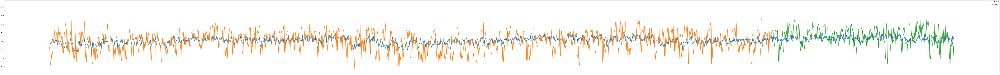

In [154]:
plt.figure(figsize=(200,15))
plt.plot(np.arange(len(y)), ridge.predict(X_std), label='Predicted')
plt.plot(np.arange(len(train_plot)), train_plot, label='Training')
plt.plot(np.arange(len(y_test))+len(y_train), y_test, label='Testing')
plt.legend()

plt.show()

In [155]:
# r_squared
print('Training R squared')
print('Linear:', metrics.mean_squared_error(y_train, train_lm)*len(train_lm))
print('Ridge :', metrics.mean_squared_error(y_train, train_ridge)*len(train_ridge))

Training R squared
Linear: 163586683128.13507
Ridge : 163586683751.02557


In [156]:
# r_squared 
print('Testing R squared')
print('Linear:', metrics.mean_squared_error(y_test, test_lm) * len(test_lm))
print('Ridge :', metrics.mean_squared_error(y_test, test_ridge) * len(test_ridge))

Testing R squared
Linear: 42505544106.63159
Ridge : 42506325222.3911


In [157]:
# RMSE

print('Training RMSE')
print('Linear :', metrics.mean_squared_error(y_train, train_ridge, squared=False))
print('Ridge :', metrics.mean_squared_error(y_test, test_ridge, squared=False))

Training RMSE
Linear : 4830.754479118296
Ridge : 4924.201570614091


In [158]:
print('Testing RMSE')
print('Linear :', metrics.mean_squared_error(y_test, test_ridge, squared=False))
print('Ridge :', metrics.mean_squared_error(y_test, test_ridge, squared=False))

Testing RMSE
Linear : 4924.201570614091
Ridge : 4924.201570614091


In [79]:
# Choose best model and motivate why it is the best choice

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

In [ ]:
# discuss chosen methods logic